In [46]:
import pandas as pd
import numpy as np
import altair as alt

alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [61]:
K = pd.read_csv('../kernel_matrices/dirac.txt', sep=' ', header=None)
K.head()

,0,1,2,3,4,5,6,7,8,9,...,379,380,381,382,383,384,385,386,387,388
0,1.000000,0.421697,0.413898,0.411397,0.420447,0.423279,0.422654,0.560865,0.404260,0.416915,...,0.338189,0.344149,0.348563,0.344075,0.343891,0.340691,0.345032,0.342788,0.346135,0.343376
1,0.421697,1.000000,0.421440,0.410109,0.423794,0.418828,0.430416,0.423794,0.409778,0.417724,...,0.340912,0.342714,0.343450,0.347607,0.337270,0.344480,0.343560,0.343818,0.343928,0.348637
2,0.413898,0.421440,1.000000,0.407828,0.413567,0.414818,0.420594,0.423022,0.408160,0.411286,...,0.345657,0.352537,0.353603,0.346356,0.346283,0.350844,0.349005,0.346724,0.346908,0.348122
3,0.411397,0.410109,0.407828,1.000000,0.409484,0.404849,0.413420,0.406762,0.402678,0.404076,...,0.346356,0.354781,0.350035,0.348085,0.348674,0.351690,0.355332,0.347202,0.352904,0.354744
4,0.420447,0.423794,0.413567,0.409484,1.000000,0.415149,0.424788,0.422028,0.404885,0.413383,...,0.344738,0.343376,0.350660,0.346025,0.350182,0.344443,0.347975,0.347386,0.341537,0.345436


In [91]:
K = K.reset_index().rename(columns={'index': 'individual1'})

In [93]:
long_form = pd.melt(K, id_vars='individual1', var_name='individual2')

In [94]:
long_form.head()

,individual1,individual2,value
0,0,0,1.000000
1,1,0,0.421697
2,2,0,0.413898
3,3,0,0.411397
4,4,0,0.420447


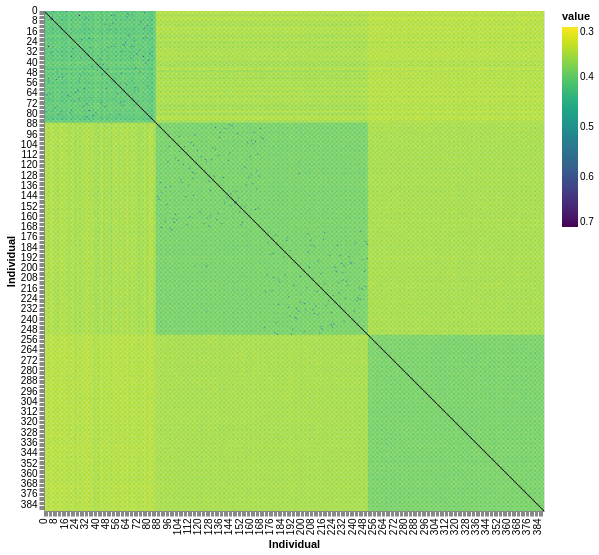

In [108]:
alt.Chart(long_form).mark_rect().encode(
    x=alt.X('individual1:O', title='Individual'),
    y=alt.Y('individual2:O', title='Individual'),
    color=alt.Color('value:Q', scale=alt.Scale(domain=[0.7, 0.3], scheme='viridis'))
).properties(
    width=500,
    height=500
)